In [4]:
import os
import time
from glob import glob
from tqdm import tqdm

import cv2
import numpy as np
import pandas as pd
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import albumentations as A
from scipy.ndimage.morphology import binary_dilation
import segmentation_models_pytorch as smp
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split

import torch
from torch.optim import Adam
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T

In [5]:
device = torch.device("cuda")

# Data Preprocessing

#### Get all files

In [44]:
files_dir = '/kaggle/input/lgg-mri-segmentation/lgg-mri-segmentation/kaggle_3m/'
file_paths = glob(f'{files_dir}/*/*[0-9].tif')

#### Read csv file of data

In [46]:
csv_path = '/kaggle/input/lgg-mri-segmentation/lgg-mri-segmentation/kaggle_3m/data.csv'
df = pd.read_csv(csv_path)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110 entries, 0 to 109
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Patient                    110 non-null    object 
 1   RNASeqCluster              92 non-null     float64
 2   MethylationCluster         109 non-null    float64
 3   miRNACluster               110 non-null    int64  
 4   CNCluster                  108 non-null    float64
 5   RPPACluster                98 non-null     float64
 6   OncosignCluster            105 non-null    float64
 7   COCCluster                 110 non-null    int64  
 8   histological_type          109 non-null    float64
 9   neoplasm_histologic_grade  109 non-null    float64
 10  tumor_tissue_site          109 non-null    float64
 11  laterality                 109 non-null    float64
 12  tumor_location             109 non-null    float64
 13  gender                     109 non-null    float64

In [12]:
df

,Patient,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01
0,TCGA_CS_4941,2.0,4.0,2,2.0,NaN,3.0,2,1.0,2.0,1.0,3.0,2.0,2.0,67.0,3.0,2.0,1.0
1,TCGA_CS_4942,1.0,5.0,2,1.0,1.0,2.0,1,1.0,2.0,1.0,3.0,2.0,1.0,44.0,2.0,NaN,1.0
2,TCGA_CS_4943,1.0,5.0,2,1.0,2.0,2.0,1,1.0,2.0,1.0,1.0,2.0,2.0,37.0,3.0,NaN,0.0
3,TCGA_CS_4944,NaN,5.0,2,1.0,2.0,1.0,1,1.0,1.0,1.0,3.0,6.0,2.0,50.0,3.0,NaN,0.0
4,TCGA_CS_5393,4.0,5.0,2,1.0,2.0,3.0,1,1.0,2.0,1.0,1.0,6.0,2.0,39.0,3.0,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,TCGA_HT_8563,2.0,5.0,3,1.0,NaN,2.0,2,1.0,2.0,1.0,3.0,2.0,1.0,30.0,3.0,2.0,0.0
106,TCGA_HT_A5RC,2.0,4.0,2,2.0,NaN,3.0,2,1.0,2.0,1.0,1.0,2.0,1.0,70.0,3.0,2.0,1.0
107,TCGA_HT_A616,NaN,5.0,2,1.0,NaN,2.0,1,1.0,1.0,1.0,1.0,2.0,1.0,36.0,3.0,2.0,0.0
108,TCGA_HT_A61A,NaN,5.0,2,NaN,NaN,NaN,1,3.0,1.0,1.0,1.0,6.0,1.0,20.0,3.0,2.0,0.0


#### Missing values handling

In [47]:
imputer = SimpleImputer(strategy="most_frequent")

df = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)
df

,Patient,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01
0,TCGA_CS_4941,2.0,4.0,2,2.0,2.0,3.0,2,1.0,2.0,1.0,3.0,2.0,2.0,67.0,3.0,2.0,1.0
1,TCGA_CS_4942,1.0,5.0,2,1.0,1.0,2.0,1,1.0,2.0,1.0,3.0,2.0,1.0,44.0,2.0,2.0,1.0
2,TCGA_CS_4943,1.0,5.0,2,1.0,2.0,2.0,1,1.0,2.0,1.0,1.0,2.0,2.0,37.0,3.0,2.0,0.0
3,TCGA_CS_4944,2.0,5.0,2,1.0,2.0,1.0,1,1.0,1.0,1.0,3.0,6.0,2.0,50.0,3.0,2.0,0.0
4,TCGA_CS_5393,4.0,5.0,2,1.0,2.0,3.0,1,1.0,2.0,1.0,1.0,6.0,2.0,39.0,3.0,2.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,TCGA_HT_8563,2.0,5.0,3,1.0,2.0,2.0,2,1.0,2.0,1.0,3.0,2.0,1.0,30.0,3.0,2.0,0.0
106,TCGA_HT_A5RC,2.0,4.0,2,2.0,2.0,3.0,2,1.0,2.0,1.0,1.0,2.0,1.0,70.0,3.0,2.0,1.0
107,TCGA_HT_A616,2.0,5.0,2,1.0,2.0,2.0,1,1.0,1.0,1.0,1.0,2.0,1.0,36.0,3.0,2.0,0.0
108,TCGA_HT_A61A,2.0,5.0,2,1.0,2.0,2.0,1,3.0,1.0,1.0,1.0,6.0,1.0,20.0,3.0,2.0,0.0


#### Function to get data

In [48]:
def get_file_row(path):
    """Produces ID of a patient, image and mask filenames from a particular path"""
    path_no_ext, ext = os.path.splitext(path)
    filename = os.path.basename(path)
    
    patient_id = '_'.join(filename.split('_')[:3]) # Patient ID in the csv file consists of 3 first filename segments
    
    return [patient_id, path, f'{path_no_ext}_mask{ext}']

In [49]:
# Show sample
get_file_row('/kaggle/input/lgg-mri-segmentation/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_45.tif')

['TCGA_DU_7010',
 '/kaggle/input/lgg-mri-segmentation/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_45.tif',
 '/kaggle/input/lgg-mri-segmentation/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_45_mask.tif']

#### Store the data into a dataframe

In [50]:
filenames_df = pd.DataFrame((get_file_row(filename) for filename in file_paths), columns=['Patient', 'image_filename', 'mask_filename'])
filenames_df

,Patient,image_filename,mask_filename
0,TCGA_DU_7010,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...
1,TCGA_DU_7010,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...
2,TCGA_DU_7010,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...
3,TCGA_DU_7010,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...
4,TCGA_DU_7010,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...
...,...,...,...
3924,TCGA_DU_7306,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...
3925,TCGA_DU_7306,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...
3926,TCGA_DU_7306,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...
3927,TCGA_DU_7306,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...


## Dataset Class

In [51]:
class MriDataset(Dataset):
    """
    Custom PyTorch Dataset class for loading MRI images and their corresponding masks.

    Args:
        df (DataFrame): DataFrame containing image and mask file paths.
        transform (callable, optional): Optional transformations to be applied to the images and masks.
        mean (float, optional): Mean value for image normalization.
        std (float, optional): Standard deviation value for image normalization.

    Attributes:
        df (DataFrame): DataFrame containing image and mask file paths.
        transform (callable): Transformations to be applied to the images and masks.
        mean (float): Mean value for image normalization.
        std (float): Standard deviation value for image normalization.
    """
    def __init__(self, df, transform=None, mean=0.5, std=0.25):
        super(MriDataset, self).__init__()
        self.df = df
        self.transform = transform
        self.mean = mean
        self.std = std
        
        
    def __len__(self):
        """
        Returns the total number of samples in the dataset.

        Returns:
            int: Total number of samples in the dataset.
        """
        return len(self.df)
        
    def __getitem__(self, idx, raw=False):
        """
        Retrieves the image and mask data for a given index.

        Args:
            idx (int): Index of the sample to retrieve.
            raw (bool, optional): Whether to return raw image and mask data without transformations.

        Returns:
            tuple: A tuple containing the image and mask data.
        """
        row = self.df.iloc[idx]
        img = cv2.imread(row['image_filename'], cv2.IMREAD_UNCHANGED)
        mask = cv2.imread(row['mask_filename'], cv2.IMREAD_GRAYSCALE)
        if raw:
            return img, mask
        
        if self.transform:
            augmented = self.transform(image=img, mask=mask)
            image, mask = augmented['image'], augmented['mask']
        
        img = T.functional.to_tensor(img)
        mask = mask // 255
        mask = torch.Tensor(mask)
        return img, mask

In [52]:
df = pd.merge(filenames_df, df, on="Patient")

In [53]:
df

,Patient,image_filename,mask_filename,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01
0,TCGA_DU_7010,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,2.0,5.0,2,2.0,1.0,2.0,2,1.0,2.0,1.0,1.0,2.0,1.0,58.0,3.0,2.0,1.0
1,TCGA_DU_7010,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,2.0,5.0,2,2.0,1.0,2.0,2,1.0,2.0,1.0,1.0,2.0,1.0,58.0,3.0,2.0,1.0
2,TCGA_DU_7010,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,2.0,5.0,2,2.0,1.0,2.0,2,1.0,2.0,1.0,1.0,2.0,1.0,58.0,3.0,2.0,1.0
3,TCGA_DU_7010,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,2.0,5.0,2,2.0,1.0,2.0,2,1.0,2.0,1.0,1.0,2.0,1.0,58.0,3.0,2.0,1.0
4,TCGA_DU_7010,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,2.0,5.0,2,2.0,1.0,2.0,2,1.0,2.0,1.0,1.0,2.0,1.0,58.0,3.0,2.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3924,TCGA_DU_7306,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,2.0,3.0,2,1.0,2.0,2.0,1,2.0,1.0,1.0,3.0,6.0,2.0,67.0,3.0,2.0,0.0
3925,TCGA_DU_7306,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,2.0,3.0,2,1.0,2.0,2.0,1,2.0,1.0,1.0,3.0,6.0,2.0,67.0,3.0,2.0,0.0
3926,TCGA_DU_7306,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,2.0,3.0,2,1.0,2.0,2.0,1,2.0,1.0,1.0,3.0,6.0,2.0,67.0,3.0,2.0,0.0
3927,TCGA_DU_7306,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,/kaggle/input/lgg-mri-segmentation/lgg-mri-seg...,2.0,3.0,2,1.0,2.0,2.0,1,2.0,1.0,1.0,3.0,6.0,2.0,67.0,3.0,2.0,0.0


### Split data into train, valid, and test

In [54]:
train_df, test_df = train_test_split(df, test_size=0.3)
test_df, valid_df = train_test_split(test_df, test_size=0.5)

## Transforming

### A.Compose

`A.Compose` is a class from the Albumentations library used to create a sequence of image transformations to be applied sequentially. It allows you to define a pipeline of augmentation techniques that will be applied to input images and masks.

- **transforms** (list): A list containing instances of transformation classes provided by Albumentations. These transformations will be applied sequentially to the input data. In our case, the transformations include `A.ChannelDropout`, `A.RandomBrightnessContrast`, and `A.ColorJitter`.

1. **ChannelDropout**: Randomly sets a certain percentage of image channels to zero.

2. **RandomBrightnessContrast**: Randomly adjusts the brightness and contrast of the image.

3. **ColorJitter**: Randomly changes the brightness, contrast, saturation, and hue of the image.

- **Parameters**:
    - **p** (float, optional): The probability of applying all the transformations in the sequence.

In [55]:
transform = A.Compose([
    A.ChannelDropout(p=0.3),
    A.RandomBrightnessContrast(p=0.3),
    A.ColorJitter(p=0.3),
])

In [ ]:
train_dataset = MriDataset(train_df, transform)
valid_dataset = MriDataset(valid_df)
test_dataset = MriDataset(test_df)

## DataLoaders

The `DataLoader` class from PyTorch is used to load datasets in a batch-wise manner, facilitating efficient training and validation of machine learning models. It allows for easy batch sampling, shuffling, and multi-threaded data loading.

1. shuffle (bool, optional): Whether to shuffle the data at every epoch. This is set to True for train_loader and valid_loader to ensure the model does not learn the order of the training samples, promoting better generalization.

In [56]:
batch_size = 16

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=1)

#### Show sample

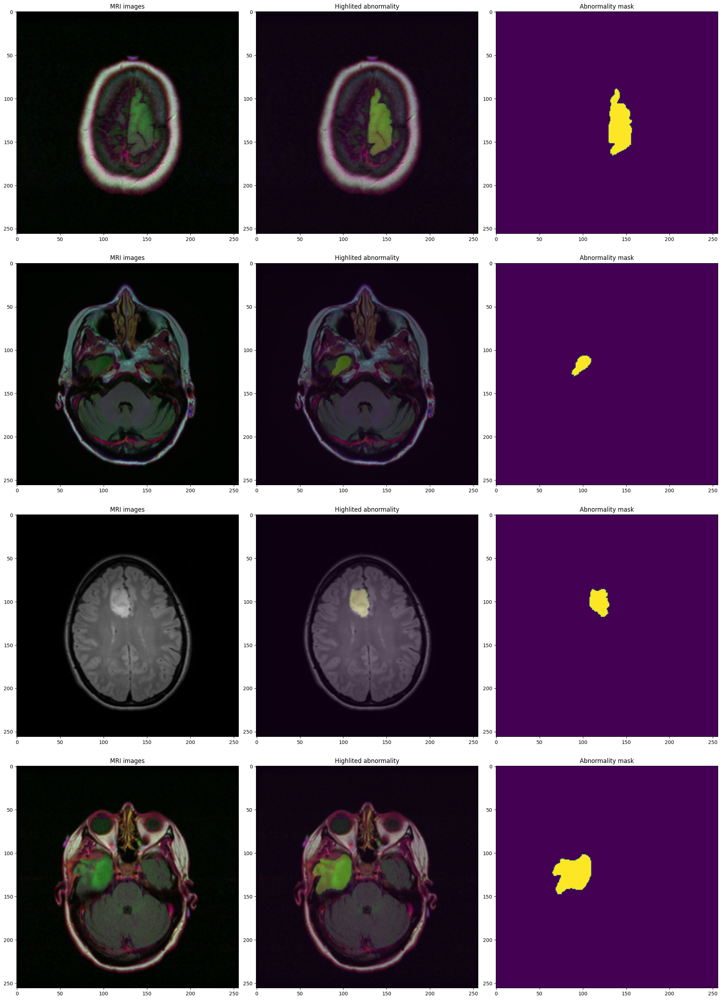

In [57]:
%matplotlib inline
n_examples = 4

fig, axs = plt.subplots(n_examples, 3, figsize=(20, n_examples*7), constrained_layout=True)
i = 0
for ax in axs:
    while True:
        image, mask = train_dataset.__getitem__(i, raw=True)
        i += 1
        if np.any(mask): 
            ax[0].set_title("MRI images")
            ax[0].imshow(image)
            ax[1].set_title("Highlited abnormality")
            ax[1].imshow(image)
            ax[1].imshow(mask, alpha=0.2)
            ax[2].imshow(mask)
            ax[2].set_title("Abnormality mask")
            break
        
    
    

# Model Structure

## EarlyStopping Class

The `EarlyStopping` class is a utility to stop the training of a PyTorch model early if the validation loss does not improve after a certain number of epochs. This helps to prevent overfitting and saves computational resources by terminating training once it is unlikely that further improvement will occur.


In [58]:
class EarlyStopping():
    """
    Stops training when loss stops decreasing in a PyTorch module.
    """
    def __init__(self, patience: int = 6, min_delta: float = 0, weights_path: str = 'weights.pt'):
        """
        Initializes the EarlyStopping object.

        Args:
            patience (int): Number of epochs of non-decreasing loss before stopping.
            min_delta (float): Minimum difference between best and new loss that is considered an improvement.
            weights_path (str): Path to the file that should store the model's weights.
        """
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = float('inf')
        self.weights_path = weights_path

    def __call__(self, val_loss: float, model: torch.nn.Module):
        """
        Checks if the validation loss has improved and updates the internal state accordingly. 
        If no improvement is detected for a number of epochs equal to `patience`, training is stopped.

        Args:
            val_loss (float): The current epoch's validation loss.
            model (torch.nn.Module): The model that is being trained.

        Returns:
            bool: True if training should stop, False otherwise.
        """
        if self.best_loss - val_loss > self.min_delta:
            self.best_loss = val_loss
            torch.save(model.state_dict(), self.weights_path)
            self.counter = 0
        else:
            self.counter += 1
            if self.counter >= self.patience:
                return True
        return False

    def load_weights(self, model: torch.nn.Module):
        """
        Loads weights of the best model.

        Args:
            model (torch.nn.Module): Model to which the weights should be loaded.
        """
        return model.load_state_dict(torch.load(self.weights_path))

### Create metrics

## Intersection over Union (IoU) and Dice Coefficient Functions

These functions compute two common evaluation metrics for image segmentation tasks: Intersection over Union (IoU) and Dice coefficient. 
<br> Both metrics measure the similarity between predicted segmentation masks and ground truth masks.

#### `iou_pytorch`

Calculates the Intersection over Union (IoU) for a tensor of predictions and labels.


In [ ]:
def iou_pytorch(predictions: torch.Tensor, labels: torch.Tensor, e: float = 1e-7):
    """Calculates Intersection over Union for a tensor of predictions"""
    predictions = torch.where(predictions > 0.5, 1, 0)
    labels = labels.byte()
    
    intersection = (predictions & labels).float().sum((1, 2))
    union = (predictions | labels).float().sum((1, 2))
    
    iou = (intersection + e) / (union + e)
    return iou

#### `dice_pytorch`

Calculates the Dice coefficient for a tensor of predictions and labels.

In [59]:
def dice_pytorch(predictions: torch.Tensor, labels: torch.Tensor, e: float = 1e-7):
    """Calculates Dice coefficient for a tensor of predictions"""
    predictions = torch.where(predictions > 0.5, 1, 0)
    labels = labels.byte()
    
    intersection = (predictions & labels).float().sum((1, 2))
    return ((2 * intersection) + e) / (predictions.float().sum((1, 2)) + labels.float().sum((1, 2)) + e)

### Loss function

## BCE_dice Function

The `BCE_dice` function computes a hybrid loss that combines Binary Cross Entropy (BCE) and Dice loss. <br>This loss function is useful for training segmentation models, as it leverages the strengths of both BCE and Dice losses.


In [60]:
def BCE_dice(output, target, alpha=0.01):
    """Calculates a combined loss of Binary Cross Entropy and Dice loss for a tensor of predictions and target values.

    Args:
        output (torch.Tensor): Predictions of the model.
        target (torch.Tensor): Target values.
        alpha (float): Weight of the Dice loss.

    Returns:
        torch.Tensor: The combined BCE and Dice loss.
    """
    bce = torch.nn.functional.binary_cross_entropy(output, target)
    soft_dice = 1 - dice_pytorch(output, target).mean()
    return bce + alpha * soft_dice

### UNet Model with EfficientNetB7 as a Backbone


### Explanation

- **UNet Model**: The UNet model is a popular architecture for image segmentation tasks. It consists of an encoder-decoder structure where the encoder captures the context of the input image and the decoder enables precise localization using transposed convolutions.

- **EfficientNetB7 Backbone**: EfficientNet is a family of convolutional neural networks that achieve high performance while being computationally efficient. EfficientNet-B7 is one of the larger models in the EfficientNet family and is known for its accuracy on image classification tasks. Using EfficientNet-B7 as the encoder helps in capturing rich feature representations from the input images.

- **encoder_name="efficientnet-b7"**: Specifies the backbone network to be EfficientNet-B7. This model is pre-trained on the ImageNet dataset.

- **encoder_weights="imagenet"**: Indicates that the encoder should use weights pre-trained on the ImageNet dataset. Pre-trained weights help in leveraging transfer learning, which can lead to faster convergence and improved performance, especially when the dataset is small or similar to ImageNet.

- **in_channels=3**: Specifies the number of input channels. In this case, 3 channels correspond to RGB images.

- **classes=1**: Specifies the number of output channels. Here, `classes=1` indicates a binary segmentation task where each pixel belongs to either the foreground or background.

- **activation='sigmoid'**: Uses the sigmoid activation function in the final layer. This is suitable for binary segmentation tasks, where each output pixel represents the probability of the pixel belonging to the foreground class.

This model architecture is well-suited for tasks such as medical image segmentation, where precise delineation of structures is crucial. The combination of EfficientNet-B7 and UNet provides a powerful tool for achieving high accuracy in segmentation tasks.

In [61]:
model = smp.Unet(
    encoder_name="efficientnet-b7",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1,
    activation='sigmoid',
)
model.to(device);

# Training

In [1]:
def training_loop(epochs, model, train_loader, valid_loader, optimizer, loss_fn, lr_scheduler):
    """
    Trains a PyTorch model for a specified number of epochs, using provided training and validation data loaders,
    optimizer, loss function, and learning rate scheduler. Incorporates early stopping to prevent overfitting.

    Args:
        epochs (int): Number of epochs to train the model.
        model (torch.nn.Module): The PyTorch model to be trained.
        train_loader (torch.utils.data.DataLoader): DataLoader for training data.
        valid_loader (torch.utils.data.DataLoader): DataLoader for validation data.
        optimizer (torch.optim.Optimizer): Optimizer for updating the model parameters.
        loss_fn (callable): Loss function to be minimized.
        lr_scheduler (torch.optim.lr_scheduler): Learning rate scheduler.

    Returns:
        dict: A dictionary containing the history of training and validation loss, validation IoU, and validation Dice coefficient.
    """
    history = {'train_loss': [], 'val_loss': [], 'val_IoU': [], 'val_dice': []}
    early_stopping = EarlyStopping(patience=7)
    
    for epoch in range(1, epochs + 1):
        start_time = time.time()
        
        running_loss = 0
        model.train()
        for i, data in enumerate(tqdm(train_loader)):
            img, mask = data
            img, mask = img.to(device), mask.to(device)
            predictions = model(img)
            predictions = predictions.squeeze(1)
            loss = loss_fn(predictions, mask)
            running_loss += loss.item() * img.size(0)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
        
        model.eval()
        with torch.no_grad():
            running_IoU = 0
            running_dice = 0
            running_valid_loss = 0
            for i, data in enumerate(valid_loader):
                img, mask = data
                img, mask = img.to(device), mask.to(device)
                predictions = model(img)
                predictions = predictions.squeeze(1)
                running_dice += dice_pytorch(predictions, mask).sum().item()
                running_IoU += iou_pytorch(predictions, mask).sum().item()
                loss = loss_fn(predictions, mask)
                running_valid_loss += loss.item() * img.size(0)
        train_loss = running_loss / len(train_loader.dataset)
        val_loss = running_valid_loss / len(valid_loader.dataset)
        val_dice = running_dice / len(valid_loader.dataset)
        val_IoU = running_IoU / len(valid_loader.dataset)
        
        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['val_IoU'].append(val_IoU)
        history['val_dice'].append(val_dice)
        print(f'Epoch: {epoch}/{epochs} | Training loss: {train_loss} | Validation loss: {val_loss} | Validation Mean IoU: {val_IoU} '
         f'| Validation Dice coefficient: {val_dice}')
        
        lr_scheduler.step(val_loss)
        if early_stopping(val_loss, model):
            early_stopping.load_weights(model)
            break
    model.eval()
    return history

In [63]:
loss_fn = BCE_dice
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 60
lr_scheduler = ReduceLROnPlateau(optimizer=optimizer, patience=2,factor=0.2)

In [64]:
history = training_loop(epochs, model, train_loader, valid_loader, optimizer, loss_fn, lr_scheduler)

100%|██████████| 172/172 [03:09<00:00,  1.10s/it]


Epoch: 1/60 | Training loss: 0.08829907922040332 | Validation loss: 0.14745798166525567 | Validation Mean IoU: 0.3349852311409126 | Validation Dice coefficient: 0.3687712253150293


100%|██████████| 172/172 [02:55<00:00,  1.02s/it]


Epoch: 2/60 | Training loss: 0.013773164579136805 | Validation loss: 0.024819380562689345 | Validation Mean IoU: 0.8040261252451751 | Validation Dice coefficient: 0.8407191567501779


100%|██████████| 172/172 [02:55<00:00,  1.02s/it]


Epoch: 3/60 | Training loss: 0.00913989571346478 | Validation loss: 0.010252940162258634 | Validation Mean IoU: 0.7634473671347408 | Validation Dice coefficient: 0.7920188079446049


100%|██████████| 172/172 [02:55<00:00,  1.02s/it]


Epoch: 4/60 | Training loss: 0.008165635731748559 | Validation loss: 0.0065069734221482175 | Validation Mean IoU: 0.8853237879478325 | Validation Dice coefficient: 0.9115507125854492


100%|██████████| 172/172 [02:55<00:00,  1.02s/it]


Epoch: 5/60 | Training loss: 0.005882337124848908 | Validation loss: 0.005937480613573502 | Validation Mean IoU: 0.8722690388307733 | Validation Dice coefficient: 0.8967797974408683


100%|██████████| 172/172 [02:55<00:00,  1.02s/it]


Epoch: 6/60 | Training loss: 0.005039257907731967 | Validation loss: 0.005781418462362835 | Validation Mean IoU: 0.9102059913893877 | Validation Dice coefficient: 0.9346946522340936


100%|██████████| 172/172 [02:55<00:00,  1.02s/it]


Epoch: 7/60 | Training loss: 0.00514665974185548 | Validation loss: 0.005505999832777149 | Validation Mean IoU: 0.8844911349021782 | Validation Dice coefficient: 0.9106030690467963


100%|██████████| 172/172 [02:55<00:00,  1.02s/it]


Epoch: 8/60 | Training loss: 0.004631471474400976 | Validation loss: 0.004827666146901705 | Validation Mean IoU: 0.9162302388983258 | Validation Dice coefficient: 0.9401156296164302


100%|██████████| 172/172 [02:55<00:00,  1.02s/it]


Epoch: 9/60 | Training loss: 0.004001425926150246 | Validation loss: 0.00506349712515534 | Validation Mean IoU: 0.9186600070888713 | Validation Dice coefficient: 0.9412510968871036


100%|██████████| 172/172 [02:55<00:00,  1.02s/it]


Epoch: 10/60 | Training loss: 0.004210967925123193 | Validation loss: 0.005489431436063122 | Validation Mean IoU: 0.8955439325106346 | Validation Dice coefficient: 0.9202219138711186


100%|██████████| 172/172 [02:55<00:00,  1.02s/it]


Epoch: 11/60 | Training loss: 0.0034786973155357622 | Validation loss: 0.005242889459734246 | Validation Mean IoU: 0.9134932485677428 | Validation Dice coefficient: 0.9386086835699566


100%|██████████| 172/172 [02:55<00:00,  1.02s/it]


Epoch: 12/60 | Training loss: 0.00305323473025452 | Validation loss: 0.004899532187698503 | Validation Mean IoU: 0.92100251731226 | Validation Dice coefficient: 0.9448322635585978


100%|██████████| 172/172 [02:55<00:00,  1.02s/it]


Epoch: 13/60 | Training loss: 0.002869325337084857 | Validation loss: 0.004952537583313503 | Validation Mean IoU: 0.9218956995818575 | Validation Dice coefficient: 0.9451643976114564


100%|██████████| 172/172 [02:55<00:00,  1.02s/it]


Epoch: 14/60 | Training loss: 0.002769394108856266 | Validation loss: 0.004892328615158291 | Validation Mean IoU: 0.9167677701529809 | Validation Dice coefficient: 0.9403745101670088


100%|██████████| 172/172 [02:55<00:00,  1.02s/it]


Epoch: 15/60 | Training loss: 0.0026608323204246435 | Validation loss: 0.005063274142853284 | Validation Mean IoU: 0.9174170235456046 | Validation Dice coefficient: 0.9408714973320396


### Evaluation

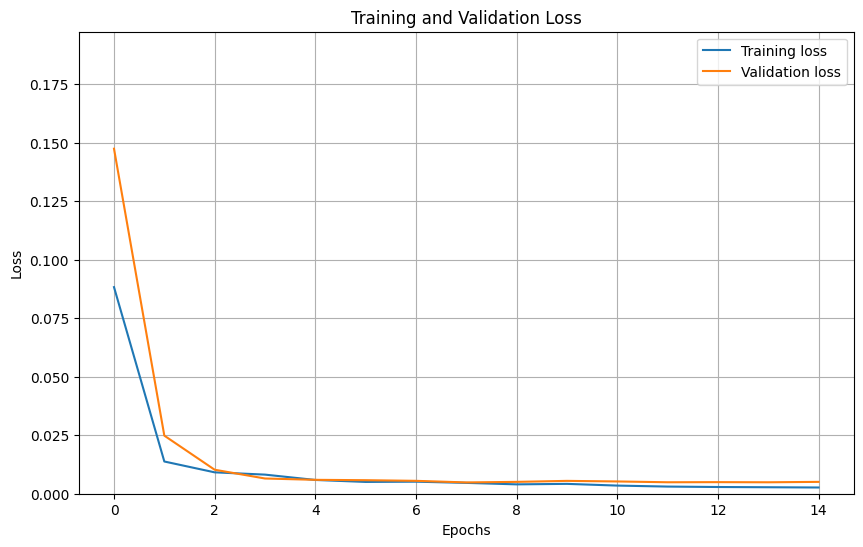

In [82]:
plt.figure(figsize=(10, 6))
plt.plot(history['train_loss'], label='Training loss')
plt.plot(history['val_loss'], label='Validation loss')
plt.ylim(0, max(max(history['train_loss']), max(history['val_loss'])) + 0.05)  # Adjusted y-axis limits
plt.legend()
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid(True)
plt.show()

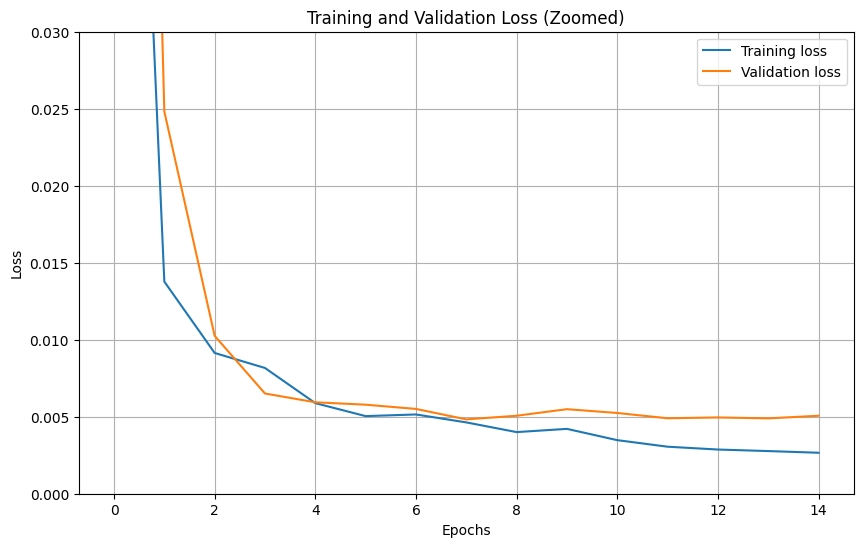

In [84]:
plt.figure(figsize=(10, 6))
plt.plot(history['train_loss'], label='Training loss')
plt.plot(history['val_loss'], label='Validation loss')
plt.ylim(0.000, 0.030)  # zomming the y-axis limits
plt.legend()
plt.title('Training and Validation Loss (Zoomed)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.grid(True)
plt.show()


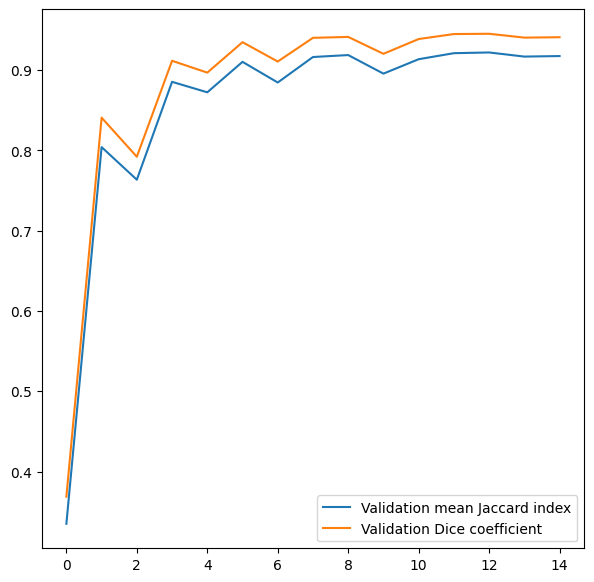

In [66]:
plt.figure(figsize=(7, 7))
plt.plot(history['val_IoU'], label='Validation mean Jaccard index')
plt.plot(history['val_dice'], label='Validation Dice coefficient')
plt.legend()
plt.show()

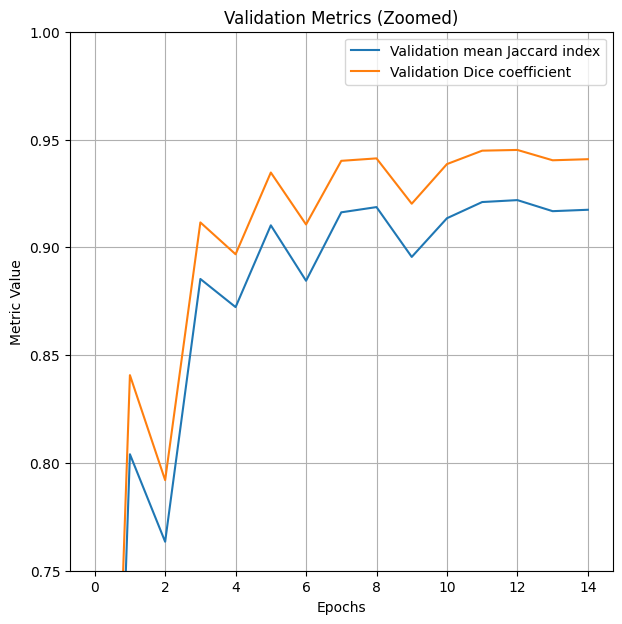

In [89]:
plt.figure(figsize=(7, 7))
plt.plot(history['val_IoU'], label='Validation mean Jaccard index')
plt.plot(history['val_dice'], label='Validation Dice coefficient')
plt.ylim(0.75, 1)  # zoomed y-axis limits
plt.legend()
plt.title('Validation Metrics (Zoomed)')
plt.xlabel('Epochs')
plt.ylabel('Metric Value')
plt.grid(True)
plt.show()


## Test Evaluation

In [67]:
with torch.no_grad():
    running_IoU = 0
    running_dice = 0
    running_loss = 0
    for i, data in enumerate(test_loader):
        img, mask = data
        img, mask = img.to(device), mask.to(device)
        predictions = model(img)
        predictions = predictions.squeeze(1)
        running_dice += dice_pytorch(predictions, mask).sum().item()
        running_IoU += iou_pytorch(predictions, mask).sum().item()
        loss = loss_fn(predictions, mask)
        running_loss += loss.item() * img.size(0)
    loss = running_loss / len(test_dataset)
    dice = running_dice / len(test_dataset)
    IoU = running_IoU / len(test_dataset)
    
    print(f'Tests: loss: {loss} | Mean IoU: {IoU} | Dice coefficient: {dice}')

Tests: loss: 0.005461862678592155 | Mean IoU: 0.8961592923290093 | Dice coefficient: 0.9242407595175876


# Testing

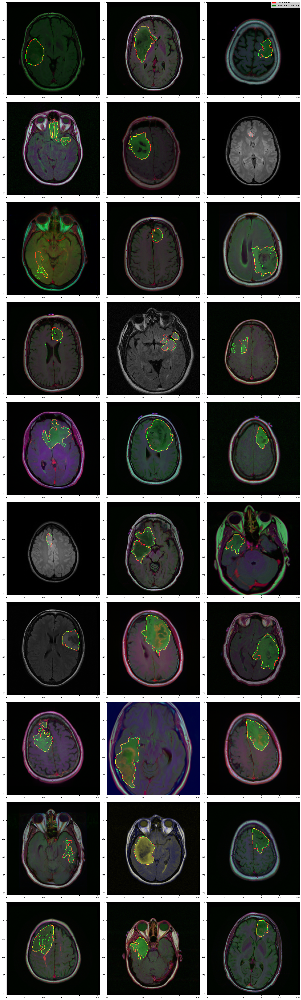

In [68]:
%matplotlib inline

width = 3
columns = 10
n_examples = columns * width

fig, axs = plt.subplots(columns, width, figsize=(7*width , 7*columns), constrained_layout=True)
red_patch = mpatches.Patch(color='red', label='The red data')
fig.legend(loc='upper right',handles=[
    mpatches.Patch(color='red', label='Ground truth'),
    mpatches.Patch(color='green', label='Predicted abnormality')])
i = 0
with torch.no_grad():
    for data in test_loader:
        image, mask = data
        mask = mask[0]
        if not mask.byte().any():
            continue
        image = image.to(device)
        prediction = model(image).to('cpu')[0][0]
        prediction = torch.where(prediction > 0.5, 1, 0)
        prediction_edges = prediction - binary_dilation(prediction)
        ground_truth = mask - binary_dilation(mask)
        image[0, 0, ground_truth.bool()] = 1
        image[0, 1, prediction_edges.bool()] = 1
        
        axs[i//width][i%width].imshow(image[0].to('cpu').permute(1, 2, 0))
        if n_examples == i + 1:
            break
        i += 1


In [69]:
torch.save(model.state_dict(), 'modelo_segmentacao_att.pth')

In [70]:
print(model)


Unet(
  (encoder): EfficientNetEncoder(
    (_conv_stem): Conv2dStaticSamePadding(
      3, 64, kernel_size=(3, 3), stride=(2, 2), bias=False
      (static_padding): ZeroPad2d((0, 1, 0, 1))
    )
    (_bn0): BatchNorm2d(64, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
    (_blocks): ModuleList(
      (0): MBConvBlock(
        (_depthwise_conv): Conv2dStaticSamePadding(
          64, 64, kernel_size=(3, 3), stride=[1, 1], groups=64, bias=False
          (static_padding): ZeroPad2d((1, 1, 1, 1))
        )
        (_bn1): BatchNorm2d(64, eps=0.001, momentum=0.010000000000000009, affine=True, track_running_stats=True)
        (_se_reduce): Conv2dStaticSamePadding(
          64, 16, kernel_size=(1, 1), stride=(1, 1)
          (static_padding): Identity()
        )
        (_se_expand): Conv2dStaticSamePadding(
          16, 64, kernel_size=(1, 1), stride=(1, 1)
          (static_padding): Identity()
        )
        (_project_conv): Conv2dStaticSamePaddi